<a href="https://colab.research.google.com/github/DinisMartinho/Diffusion-Faces/blob/main/Colab%20Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [77]:
!pip install shutup --quiet
import torch, torchvision, matplotlib.pyplot, math, numpy, shutup
shutup.please()

In [78]:
# GPU access is necessary to run this notebook.
use_collab_gpu = True #@param {type:"boolean"}

In [79]:
if use_collab_gpu == True:
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
else:
  device = torch.device("cpu")

#### **● DDPM**

In [80]:
T = 300

In [81]:
def beta_alpha_schedule(start_schedule=0.0001, end_schedule=0.02, timesteps = 300):
    betas = torch.linspace(start_schedule, end_schedule, timesteps)

    alphas = 1 - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = torch.nn.functional.pad(alphas_cumprod[:-1], (1, 0), value=1.0)

    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)

    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    return betas, alphas, alphas_cumprod, sqrt_recip_alphas, sqrt_alphas_cumprod, \
    sqrt_one_minus_alphas_cumprod, posterior_variance, alphas_cumprod_prev

In [82]:
def get_index_from_list(values, t, x_shape):
    batch_size = t.shape[0]
    result = values.gather(-1, t.cpu())
    """
    Here, torch.ones_like(result)[:, 0] creates a tensor of ones with the same shape 
    as result and selects the shape information
    along the first dimension ([:, 0]). This yields a tensor with shape (1,).
    """
    return result.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

In [83]:
betas, alphas, alphas_cumprod, sqrt_recip_alphas, sqrt_alphas_cumprod, \
sqrt_one_minus_alphas_cumprod, posterior_variance, alphas_cumprod_prev = (beta_alpha_schedule(start_schedule=0.0001, end_schedule=0.02, timesteps = T))

#####**● Backward Diffusion**

**● Sinusoidal Positional Embeddings**

In [84]:
class SinusoidalPositionEmbeddings(torch.nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

**● U-Net Architecture**

In [85]:
class DoubleConv(torch.nn.Module):
    def __init__(self, in_channels, out_channels, time_embedding_dim):
        super(DoubleConv, self).__init__()

        self.time_embedding_module = SinusoidalPositionEmbeddings(time_embedding_dim)
        self.time_mlp = torch.nn.Linear(time_embedding_dim, out_channels)

        self.conv1 = torch.nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False)
        self.bn1   = torch.nn.BatchNorm2d(out_channels)

        self.conv2 = torch.nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False)
        self.bn2   = torch.nn.BatchNorm2d(out_channels)

        self.relu = torch.nn.ReLU(inplace=True)

    def forward(self, x, t):
        o = self.bn1(self.relu(self.conv1(x)))
        o_t = self.relu(self.time_mlp(self.time_embedding_module(t)))
        o = o + o_t[(..., ) + (None, ) * 2]
        o = self.bn2(self.relu(self.conv2(o)))
        return o

In [86]:
class UNET(torch.nn.Module):
    def __init__(
            self, in_channels=3, out_channels=3, features=[32, 64, 128, 256, 512, 1024], time_embedding_dim=32
    ):
        super(UNET, self).__init__()
        self.ups = torch.nn.ModuleList()
        self.downs = torch.nn.ModuleList()
        self.pool = torch.nn.MaxPool2d(kernel_size=2, stride=2)

        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature, time_embedding_dim))
            in_channels = feature

        for feature in reversed(features):
            self.ups.append(
                torch.nn.ConvTranspose2d(
                    feature*2, feature, kernel_size=2, stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature, time_embedding_dim))

        self.bottleneck = DoubleConv(features[-1], features[-1]*2, time_embedding_dim)
        self.final_conv = torch.nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x, t):
        skip_connections = []

        for down in self.downs:
            x = down(x, t)  
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x, t)  
        skip_connections = skip_connections[::-1]

        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx // 2]

            if x.shape != skip_connection.shape:
                x = torchvision.transforms.functional.resize(x, size=skip_connection.shape[2:])

            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx + 1](concat_skip, t)  

        return self.final_conv(x)

In [87]:
model = UNET(in_channels=3, out_channels=3, time_embedding_dim=32).to(device)

**● Download & Load Weights**


In [ ]:
!gdown 1eKclOMUXzSDyJSIm4Z2u0mTKRw5z1X5S

In [ ]:
model.load_state_dict(torch.load("./DDPM.pth"))

**● Image Synthesis**



In [105]:
def sample_timestep(x, t):
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape 
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

In [130]:
def sample_plot_image(img, j):
  with torch.no_grad():
    
    num_images = 5
    stepsize = int(T/num_images)

    fig, axes = matplotlib.pyplot.subplots(1, num_images, figsize=(32, 32))

    for i in range(0, T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)

        img = sample_timestep(img, t)

        if i % stepsize == 0:
            index = int(i / stepsize)
            img_np = img[0].permute(1, 2, 0).detach().cpu().numpy()
            img_unnormalized = (img_np * [0.5, 0.5, 0.5]) + [0.5, 0.5, 0.5]

            axes[index].imshow((img_unnormalized * 255).astype(numpy.uint8))
            axes[index].axis("off")
                    
    img_unnormalized = (img[0].permute(1, 2, 0).detach().cpu().numpy() * [0.5, 0.5, 0.5]) + [0.5, 0.5, 0.5]
    torchvision.utils.save_image(torch.from_numpy(img_unnormalized).permute(2, 0, 1), str(j) + ".png")
    matplotlib.pyplot.show()
    return

**Generate variations from a single noise tensor.**

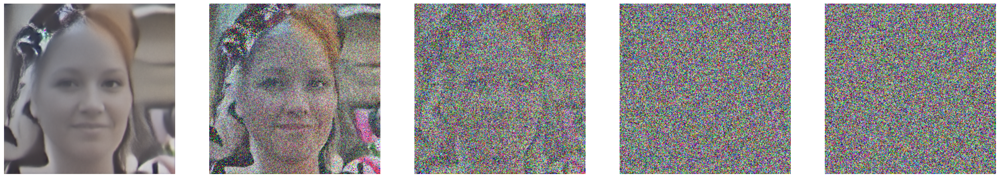

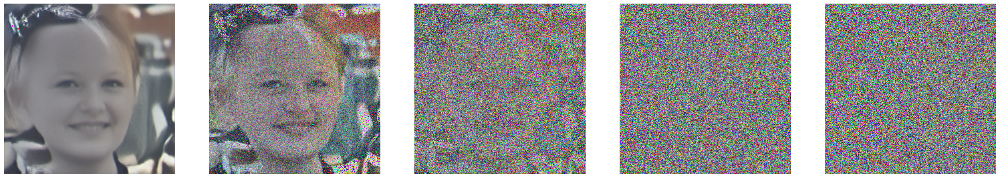

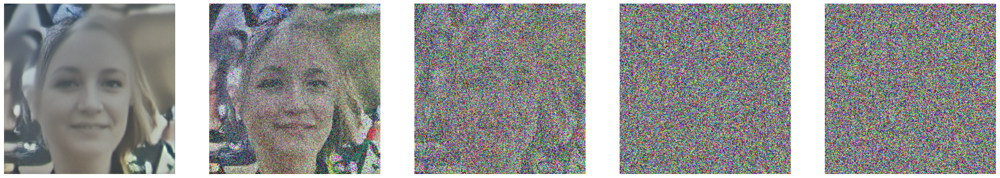

In [162]:
noise = torch.randn((1, 3, 256, 256), device=device)

for j in range(3):
  sample_plot_image(noise, j)

**Generate images from varied noise tensors.**

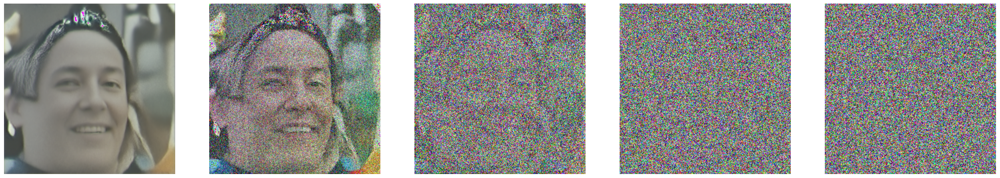

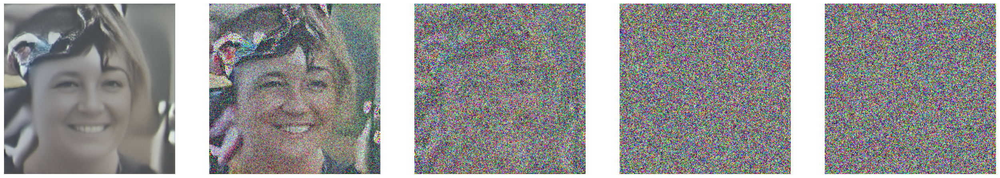

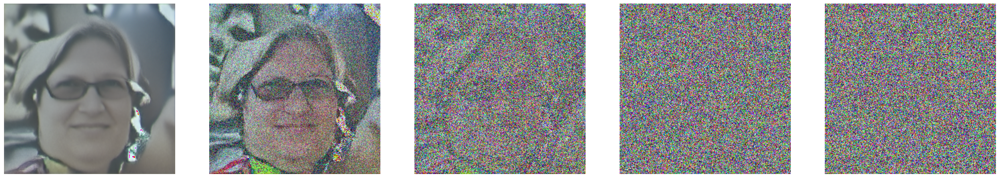

In [157]:
for j in range(3):
  noise = torch.randn((1, 3, 256, 256), device=device)
  sample_plot_image(noise, j)